In [1]:
%matplotlib inline

import os

from predpy.dataset import MultiTimeSeriesDataset
from predpy.experimentator import (
    DatasetParams, ModelParams,
    Experimentator, load_experimentator, load_last_experimentator)
from anomaly_detection import (
    AnomalyDetector, fit_run_detection, exp_fit_run_detection,
    get_dataset, get_dataset_names, load_anom_scores)
from notebook_utils.modeling import (
    predict, get_rec_fbeta_score_conf_mat,
    th_ws_experiment, get_a_scores
)
from notebook_utils.plotting import (
    plot_scores, plot_kde, plot_dataset, plot_scores_and_bands
)

import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import pandas as pd
from torch.utils.data import DataLoader
import torch
from typing import List, Literal
from predpy.plotter import plot_anomalies
from pathlib import Path
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, fbeta_score


os.chdir('/home/stachu/Projects/Anomaly_detection/TSAD')
sns.set_style()

# Data and model loading

In [3]:
exp = load_experimentator('./saved_experiments/2022-05-30_22:57:20.pkl')
model_id = 0
exp.models_params

,name_,cls_,init_params,WrapperCls,wrapper_kwargs,learning_params
0,ConvMVR_ws200_nk10_ks3_es50,<class 'models.ideas.mvr.ConvMVR'>,"{'window_size': 200, 'c_in': 38, 'n_kernels': ...",<class 'models.ideas.mvr.MVRWrapper'>,{},"{'lr': 0.0001, 'criterion': MSELoss(), 'Optimi..."
1,ConvMVR_ws200_nk10_ks3_es50,<class 'models.ideas.mvr.ConvMVR'>,"{'window_size': 200, 'c_in': 38, 'n_kernels': ...",<class 'models.ideas.mvr.MVRWrapper'>,{},"{'lr': 0.0001, 'criterion': MSELoss(), 'Optimi..."
2,ConvMVR_ws200_nk10_ks3_es50,<class 'models.ideas.mvr.ConvMVR'>,"{'window_size': 200, 'c_in': 38, 'n_kernels': ...",<class 'models.ideas.mvr.MVRWrapper'>,{},"{'lr': 0.0001, 'criterion': MSELoss(), 'Optimi..."


In [4]:
m_name = 'ConvMVR_ws200_nk10_ks3_es50'
topic, colleciton_name, ds_name = 'Industry', 'ServerMachineDataset', 'machine-1-1'
exp_date = exp.exp_date
model = exp.load_pl_model(model_id, f'checkpoints/machine-1-1/{m_name}')
window_size = model.model.params['window_size']

In [5]:
train_ds = get_dataset(
    f'data/{topic}/{colleciton_name}/train/{ds_name}.csv',
    window_size=window_size)
test_ds = get_dataset(
    f'data/{topic}/{colleciton_name}/test/{ds_name}.csv',
    window_size=window_size)

train_dl = DataLoader(train_ds, batch_size=500)
test_dl = DataLoader(test_ds, batch_size=500)

test_cls_path = f'saved_scores_preds/{colleciton_name}/{ds_name}/record_classes/{window_size}.csv'
test_cls = pd.read_csv(
    test_cls_path, header=None)\
    .iloc[:, 0].to_list()
test_point_cls_path = f'data/{topic}/{colleciton_name}/test_label/{ds_name}.csv'
test_point_cls = pd.read_csv(
    test_point_cls_path, header=None)\
    .iloc[:, 0].to_list()

# Dataset plotting

Plotting "machine-1-1" dataset.  
Blue is training dataset, orange is test dataset.  
Anomalies are red regions, they are present only in test dataset.  
Not all features express anomalies.  

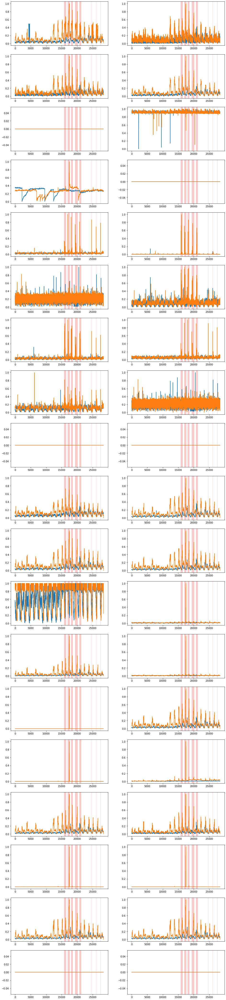

In [6]:
anoms_vrects = [
    (15849, 16368), (16963, 17517), (18071, 18528), (19367, 20088),
    (20786, 21195), (24679, 24682), (26114, 26116), (27554, 27556)]

# fig, axs = plt.subplots(19, 2, figsize=(16, 76))
# for i in range(38):
#     col = i % 2
#     row = int(i/2)
#     axs[row, col].plot(train_dl.dataset.sequences[0].to_numpy()[:, i], label='train')
#     axs[row, col].plot(test_dl.dataset.sequences[0].to_numpy()[:, i], label='test')

#     for start, end in anoms_vrect:
#         axs[row, col].axvspan(start, end, alpha=0.2, color='red')
plot_dataset(
    train_ds=train_dl.dataset.sequences[0].to_numpy(),
    test_ds=test_dl.dataset.sequences[0].to_numpy(),
    anoms_vrects=anoms_vrects)


# Collecting and storing anomaly scores

In [6]:
# test_as, pred_cls = load_anom_scores(
#     f'saved_scores_preds/ServerMachineDataset/machine-1-1/{m_name}/anom_scores.csv')

## Training scalers
Scalers are trained separate for x_hat1 and x_hat2 on part of training dataset for testing model.

In [7]:
ts = exp.load_time_series_module(0).sequences
ts = MultiTimeSeriesDataset(
    ts, window_size=window_size, target=ts[0].columns.tolist())
ts = DataLoader(ts, batch_size=500)

x_all_st, x_hat1_st, x_hat2_st = [], [], []
with torch.no_grad():
    for batch in tqdm(ts):
        x = batch['sequence']
        a, b = model.model(x)
        x_hat1_st += [a]
        x_hat2_st += [b]
        x_all_st += [x]

x_hat1_st = torch.concat(x_hat1_st, dim=0)
x_hat2_st = torch.concat(x_hat2_st, dim=0)
x_all_st = torch.concat(x_all_st, dim=0)

/home/stachu/Projects/Anomaly_detection/TSAD/predpy/preprocessing/load_and_preprocess.py:188: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/stachu/Projects/Anomaly_detection/TSAD/predpy/preprocessing/load_and_preprocess.py:203: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 57/57 [00:48<00:00,  1.17it/s]


In [8]:
x_hat1_l2_st = torch.max(x_hat1_st - x_all_st, dim=1)[0].numpy()
x_hat2_l2_st = torch.max(x_hat2_st - x_all_st, dim=1)[0].numpy()
scaler_1 = MinMaxScaler(feature_range=(0, 1))
scaler_2 = MinMaxScaler(feature_range=(0, 1))
s_x_hat1_l2_st = scaler_1.fit_transform(x_hat1_l2_st)
s_x_hat2_l2_st = scaler_2.fit_transform(x_hat2_l2_st)

In [9]:
len_, ws = x_hat1_st.shape[0:2]
len_ += ws
x_hat1_err_points_st = [
    x_hat1_st[i*ws] - x_all_st[i*ws]
    for i in range(int(len_/ws))
]
rest = len_ - int(len_/ws) * ws
x_hat1_err_points_st += [x_hat1_st[-1, -rest:] - x_all_st[-1, -rest:]]
x_hat1_err_points_st = np.concatenate(x_hat1_err_points_st)
x_hat1_err_points_st = np.abs(x_hat1_err_points_st)
x_hat1_err_points_st.shape

(28478, 38)

## Evaluating visually scalers

### Train ds scores

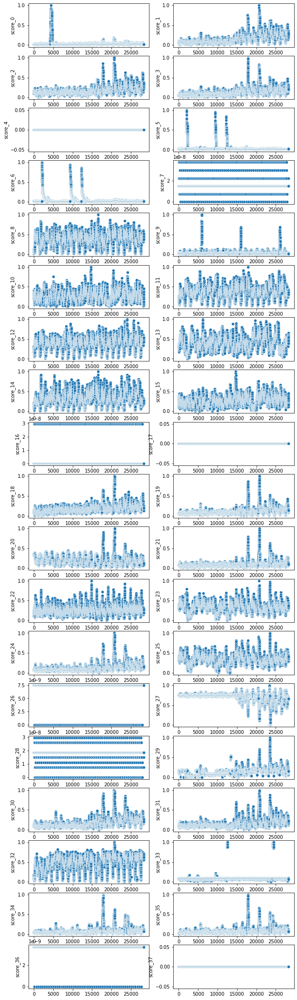

In [9]:
plot_scores(s_x_hat1_l2_st);

### Test ds scores

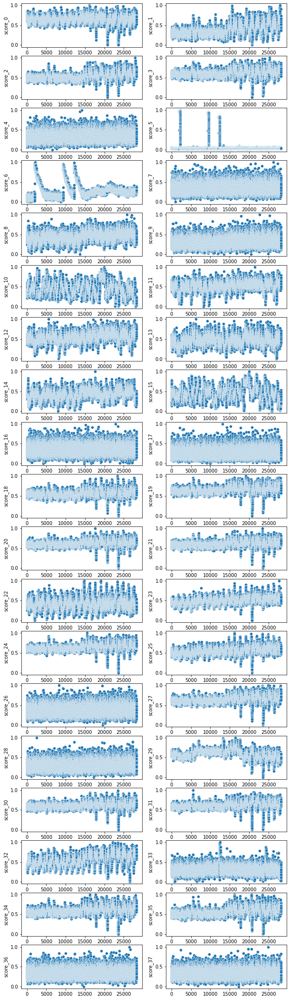

In [10]:
plot_scores(s_x_hat2_l2_st);

## Computing anomaly score
Anomaly scores are made on test dataset.

In [10]:
x_all, x_hat1, x_hat2 = [], [], []
with torch.no_grad():
    for batch in tqdm(test_dl):
        x = batch['sequence']
        a, b = model.model(x)
        x_hat1 += [a]
        x_hat2 += [b]
        x_all += [x]

x_hat1 = torch.concat(x_hat1, dim=0)
x_hat2 = torch.concat(x_hat2, dim=0)
x_all = torch.concat(x_all, dim=0)

100%|██████████| 57/57 [00:59<00:00,  1.05s/it]


## Collecting points rec err

In [11]:
len_, ws = x_hat1.shape[0:2]
len_ += ws
x_hat1_err_points = [
    x_hat1[i*ws] - x_all[i*ws]
    for i in range(int(len_/ws))
]
rest = len_ - int(len_/ws) * ws
x_hat1_err_points += [x_hat1[-1, -rest:] - x_all[-1, -rest:]]
x_hat1_err_points = np.concatenate(x_hat1_err_points)
x_hat1_err_points = np.abs(x_hat1_err_points)
x_hat1_err_points.shape

(28479, 38)

## Scaling scores

In [99]:
x_hat1_l2 = torch.max(x_hat1 - x_all, dim=1)[0].numpy()
x_hat2_l2 = torch.max(x_hat2 - x_all, dim=1)[0].numpy()

s_x_hat1_l2 = scaler_1.transform(x_hat1_l2)
s_x_hat2_l2 = scaler_2.transform(x_hat2_l2)

## Saving scores

In [12]:
dirpath = f'notebook_a_scores/{colleciton_name}/{ds_name}/{m_name}/{exp_date}/'
os.makedirs(dirpath, exist_ok=True)

# x_hat1_l2.dump(dirpath + 'x_hat1_l2.npy')
# x_hat2_l2.dump(dirpath + 'x_hat2_l2.npy')

# s_x_hat1_l2.dump(dirpath + 's_x_hat1_l2.npy')
# s_x_hat2_l2.dump(dirpath + 's_x_hat2_l2.npy')
# x_hat1_l2.dump(dirpath + 'x_hat1_max.npy')
# x_hat2_l2.dump(dirpath + 'x_hat2_max.npy')

# s_x_hat1_l2.dump(dirpath + 's_x_hat1_max.npy')
# s_x_hat2_l2.dump(dirpath + 's_x_hat2_max.npy')

x_hat1_err_points.dump(dirpath + 'x_hat1_err_points.npy')
x_hat1_err_points_st.dump(dirpath + 'x_hat1_err_points_st.npy')

## Load scores

In [7]:
dirpath = f'notebook_a_scores/{colleciton_name}/{ds_name}/{m_name}/{exp_date}/'
# x_hat1_l2 = np.load(dirpath + 'x_hat1_l2.npy', allow_pickle=True)
# x_hat2_l2 = np.load(dirpath + 'x_hat2_l2.npy', allow_pickle=True)

# s_x_hat1_l2 = np.load(dirpath + 's_x_hat1_l2.npy', allow_pickle=True)
# s_x_hat2_l2 = np.load(dirpath + 's_x_hat2_l2.npy', allow_pickle=True)

x_hat1_err_points = np.load(dirpath + 'x_hat1_err_points.npy', allow_pickle=True)
x_hat1_err_points_st = np.load(dirpath + 'x_hat1_err_points_st.npy', allow_pickle=True)

## Comparing scopes
Calculating difference in train dataset for testing (last 10% of points) and test dataset.

In [84]:
tmp = s_x_hat1_l2_st
start = int(tmp.shape[0] * 0.9)
train_scopes = []
for x_min, x_max in zip(tmp.min(axis=0).tolist(), tmp.max(axis=0).tolist()):
    train_scopes += [x_max - x_min]
train_scopes = np.array(train_scopes)

In [85]:
tmp = x_hat1_l2
test_scopes = []
for x_min, x_max in zip(tmp[:5000].min(axis=0).tolist(), tmp[:5000].max(axis=0).tolist()):
    test_scopes += [x_max - x_min]
test_scopes = np.array(test_scopes)

Due to different values scopes in training scaler dataset and test anomaly 

In [86]:
scopes_diffs = train_scopes - test_scopes
scopes_diffs[np.argwhere(scopes_diffs)]
np.round(scopes_diffs, 2)

array([-8.370e+00,  2.200e-01,  1.900e-01,  5.400e-01,  0.000e+00,
       -2.029e+01, -3.570e+00,  0.000e+00, -5.700e-01,  7.600e-01,
       -1.300e+00, -2.900e-01, -5.500e-01, -1.270e+00, -4.000e-01,
       -1.230e+00,  0.000e+00,  0.000e+00,  4.600e-01,  5.800e-01,
        1.000e-01,  5.500e-01,  5.000e-02, -3.700e-01,  4.700e-01,
       -2.000e-02,  0.000e+00,  5.300e-01,  0.000e+00,  2.400e-01,
        6.000e-01,  5.500e-01, -9.300e-01,  8.700e-01,  4.600e-01,
        4.100e-01,  0.000e+00,  0.000e+00])

# Plotting scores

## KDE over train and test datasets

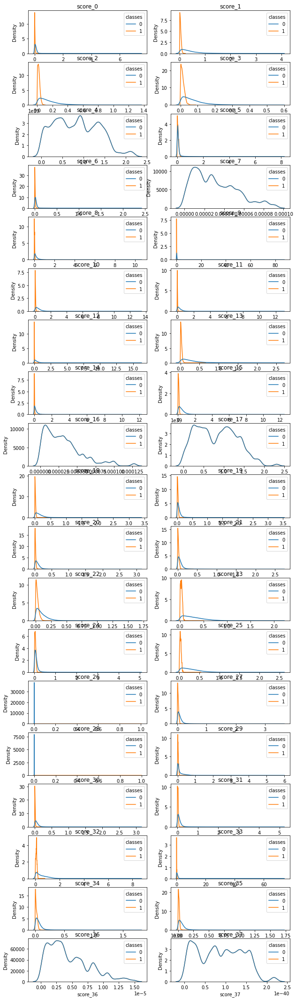

In [13]:
plot_kde(x_hat1_err_points_st, scores2=x_hat1_err_points);

## Rec err for points

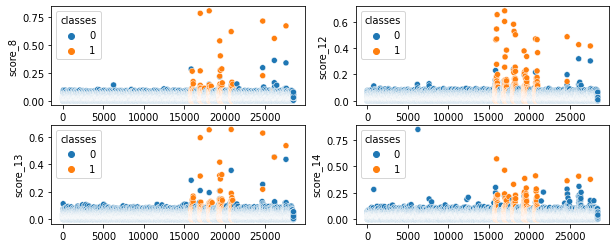

In [14]:
cols = [col - 1 for col in [9,13,14,15]]
plot_scores(x_hat1_err_points, classes=test_point_cls, features_cols=cols);

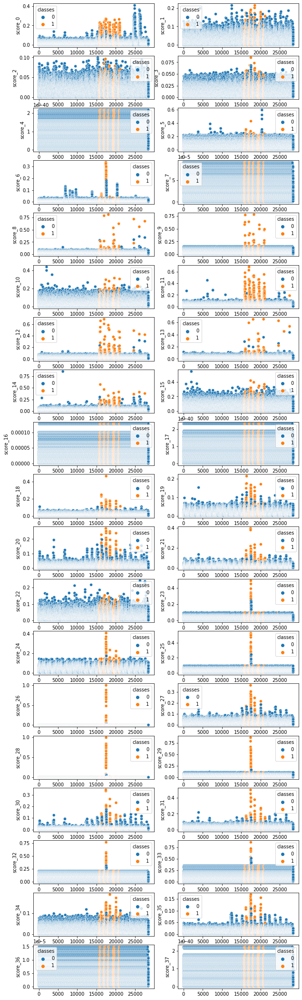

In [18]:
plot_scores(x_hat1_err_points, classes=test_point_cls);

## Decoder reconstruction error

### Scaled on test ds

In [10]:
tmp_scaler = StandardScaler()
tmp_s_x_hat1_l2 = tmp_scaler.fit_transform(x_hat1_l2)

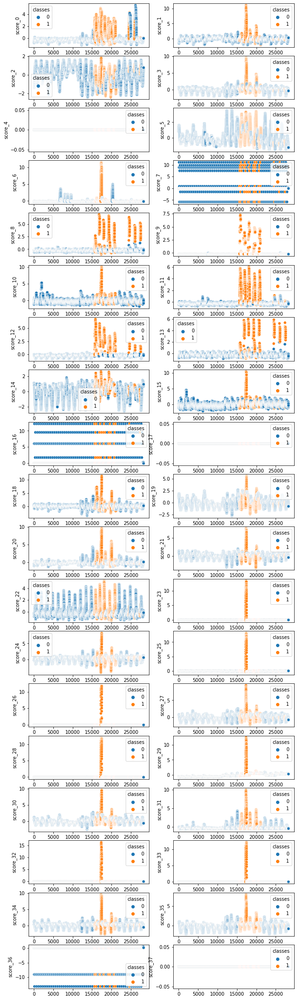

In [11]:
plot_scores(tmp_s_x_hat1_l2, classes=test_cls);

### Scaled on first 5000 test points

In [16]:
tmp2_scaler = StandardScaler().fit(x_hat1_l2[:5000, :])
tmp2_s_x_hat1_l2 = tmp2_scaler.transform(x_hat1_l2)

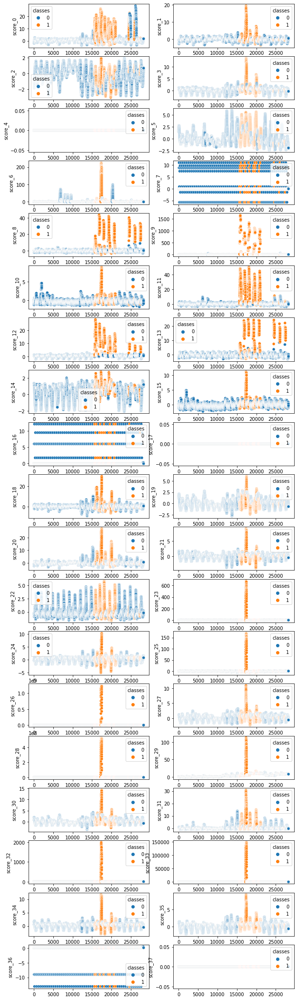

In [17]:
plot_scores(tmp2_s_x_hat1_l2, classes=test_cls);

### Not scaled

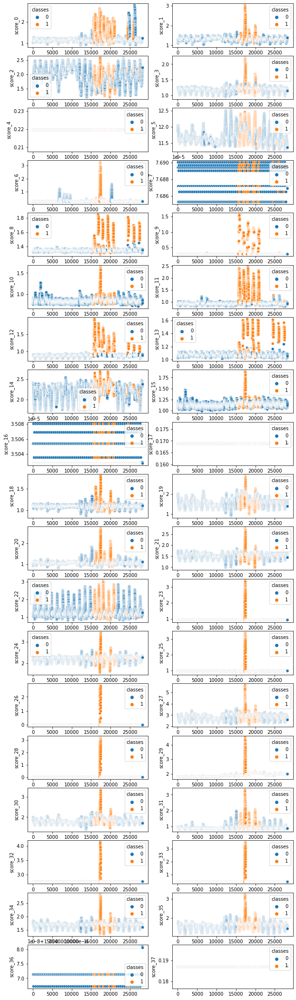

In [8]:
fig = plot_scores(x_hat1_l2, classes=test_cls)

### Scaled correctly
This scaling use scalers trained on train dataset reconstruction error.  

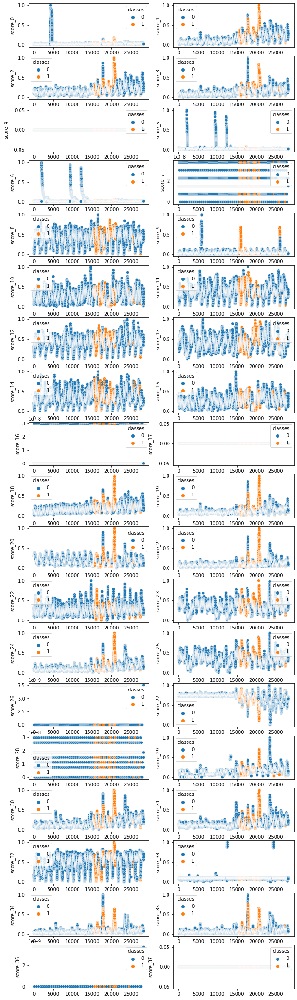

In [92]:
fig = plot_scores(s_x_hat1_l2, classes=test_cls[1:])

## Redecoder scaled reconstruction error

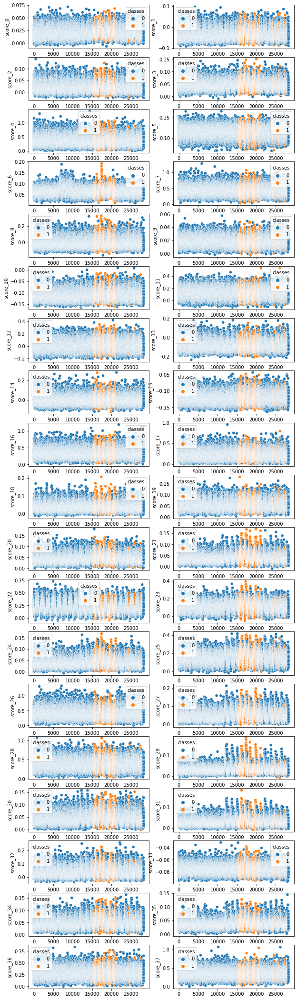

In [112]:
fig = plot_scores(s_x_hat2_l2, classes=test_cls)

# Finding best ws and th
ws - window size  
th - threshold  
Optimizing beta score.  

In [ ]:
beta = 1
wss = np.arange(100, 501, 100)
ths = np.linspace(0.25, 1.25, 50)
th_df = th_ws_experiment(
    point_scores=x_hat1_err_points, point_cls=test_point_cls,
    ths=ths, wss=wss, beta=beta)

100%|██████████| 5/5 [00:08<00:00,  1.78s/it]


Best thresholds for model window size

In [ ]:
th_df[th_df['ws'] == window_size].sort_values('f1-score', ascending=False).head()

,ws,th,f1-score,cm
59,200,0.433673,0.766041,"[[23251, 743], [1164, 3122]]"
58,200,0.413265,0.764821,"[[23238, 756], [1164, 3122]]"
57,200,0.392857,0.748837,"[[23037, 957], [1148, 3138]]"
60,200,0.454082,0.746110,"[[23324, 670], [1337, 2949]]"
56,200,0.372449,0.740377,"[[22635, 1359], [968, 3318]]"


Best threshold for every window size

In [ ]:
th_df.loc[th_df.groupby(['ws'])['f1-score'].idxmax()]

,index,ws,th,f1-score,cm
6,6,100,0.372449,0.679627,"[[24135, 759], [1301, 2185]]"
59,59,200,0.433673,0.766041,"[[23251, 743], [1164, 3122]]"
109,109,300,0.433673,0.784933,"[[22067, 1027], [1137, 3949]]"
161,161,400,0.474490,0.815781,"[[21041, 1153], [1037, 4849]]"
210,210,500,0.454082,0.839944,"[[20040, 1254], [937, 5749]]"


# Searching for descriptive statistics

In [31]:
def var(idx, df, ws):
    ws = int(ws/2)
    row = df.iloc[max(0, idx - ws):idx+ws+1].var()
    return row

ws = 200
df = pd.DataFrame(s_x_hat1_l2)

s_var = df.rolling(ws, center=True).var()
# df.index.to_series().apply(lambda idx: var(idx, df, ws))
s_var[:int(ws/2)] = [
    var(idx, df, ws)
    for idx in list(range(int(ws/2)))
]
s_var[-int(ws/2):] = [
    var(idx, df, ws)
    for idx in list(range(df.shape[0] - int(ws/2), df.shape[0]))
]

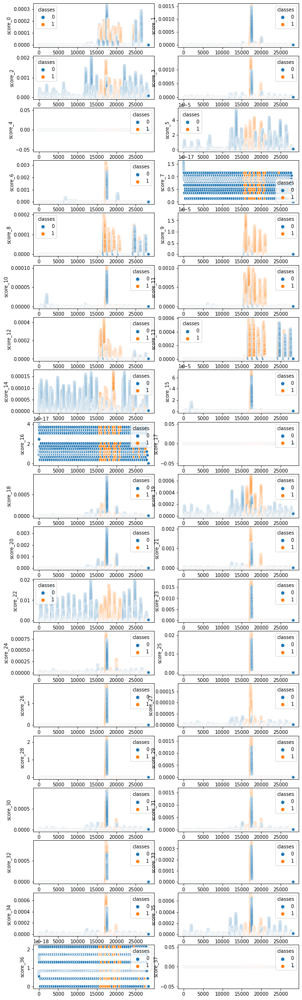

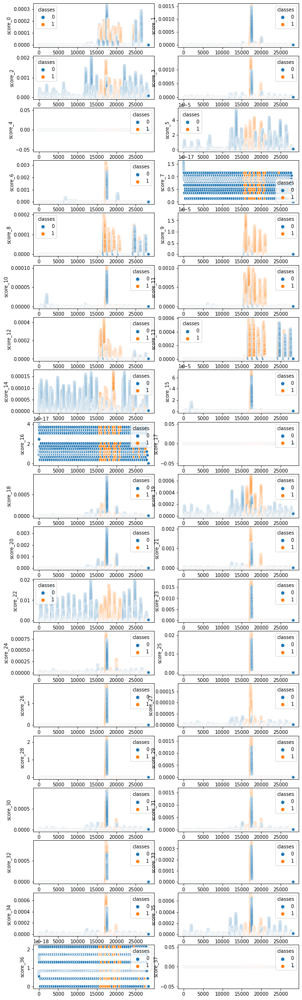

In [32]:
plot_scores(s_var.to_numpy(), classes=test_cls);

## Rec err points

In [84]:
p_diff = pd.DataFrame(x_hat1_err_points).rolling(window=2).apply(lambda x: x.iloc[1] - x.iloc[0]).dropna()

### Bollinger bands

In [118]:
rol = pd.DataFrame(x_hat1_err_points).rolling(window=500)
ma = rol.mean().dropna()
std = rol.std().dropna()
root_std = pd.DataFrame(np.sqrt(std.to_numpy()), index=std.index)

In [16]:
b_rstd = 5*root_std
b_rstd.name = '5*sqrt(std)'

In [119]:
b_std = 3*std
b_std.name = '5*sqrt(std)'

In [128]:
m = 1
bollinger = ma + m*root_std
ma.name = f'ma_ws{500}'
bollinger.name = f'bollinger_ws{500}_m{m}'

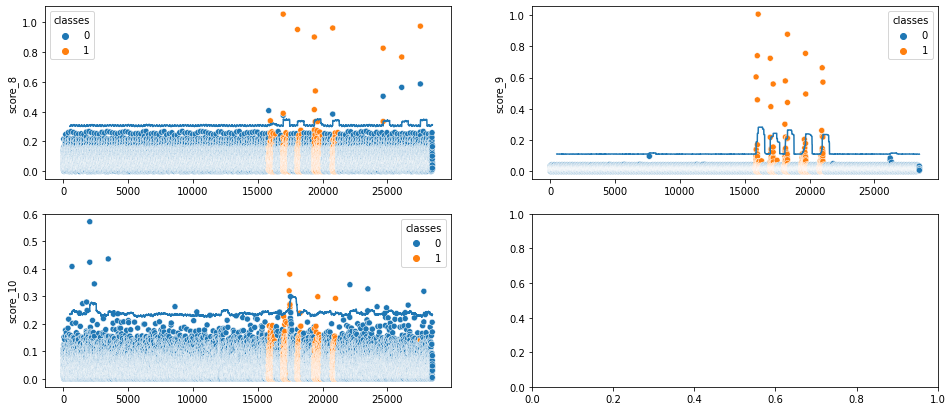

In [129]:
plot_scores_and_bands(x_hat1_err_points, [bollinger], classes=test_point_cls, features_cols=[8, 9, 10], figsize=(16, 7));

In [1]:
plot_scores(x_hat1_err_points, classes=test_point_cls)

NameError: name 'plot_scores' is not defined

# Fitting Gaussian distribution

In [79]:
from scipy.stats import norm

mean_ = x_hat1_err_points_st.mean(axis=0)
std_ = x_hat1_err_points_st.var(axis=0)

train_scores = []
test_scores = []
for i, (m, s) in enumerate(zip(mean_, std_)):
    train_scores += [1 - norm(m, s).cdf(x_hat1_err_points_st[:, i])]
    test_scores += [1 - norm(m, s).cdf(x_hat1_err_points[:, i])]

train_scores = np.stack(train_scores, axis=1)
test_scores = np.stack(test_scores, axis=1)

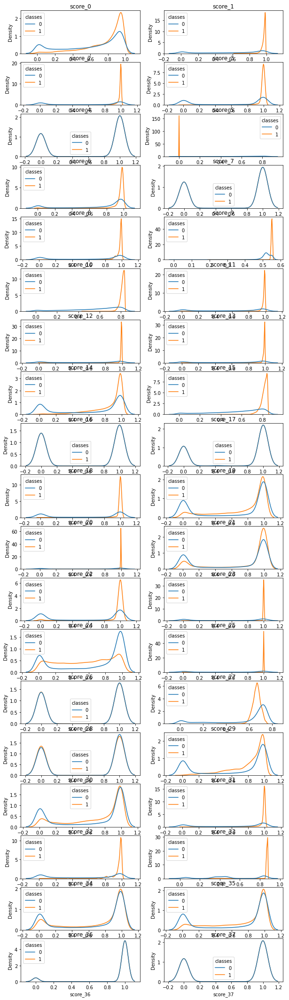

In [80]:
plot_kde(train_scores, scores2=test_scores);

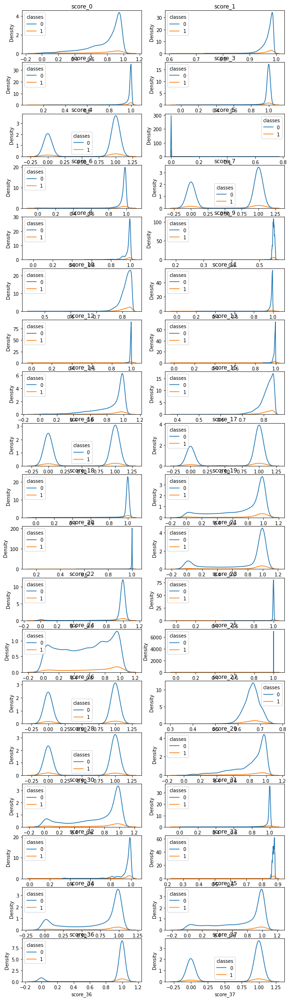

In [82]:
p_ids = np.argwhere(np.array(test_point_cls[1:]) == 1).reshape(-1)
n_ids = np.argwhere(np.array(test_point_cls[1:]) == 0).reshape(-1)
plot_kde(test_scores[n_ids], scores2=test_scores[p_ids]);

# Moving variance technique

In [ ]:
plot_scores_and_bands(
    x_hat1_err_points, [bollinger], classes=test_point_cls, features_cols=[8, 9, 10], figsize=(16, 7));